# DSC-478
# Final Project
## Bharath Goud Nadimpally

## Netflix is an application that keeps growing bigger and faster with its popularity, shows and content. This is an EDA/ a story telling through its data along with a content-based recommendation system and a wide range of different graphs and visuals.

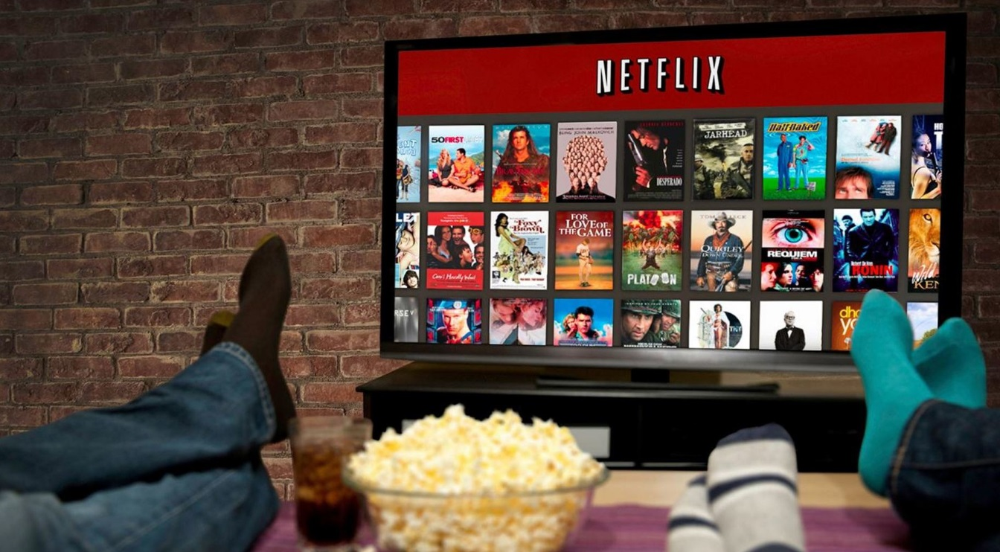

**INTRODUCTION**

**What is Netflix?** With Netflix, you can watch award-winning TV shows, movies, documentaries, and more on thousands of internet-connected devices. With Netflix, you can enjoy unlimited ad-free viewing of our content by chossing a plan. New TV shows and movies are added every month, so there's always something new to discover!

**TV Shows & Movies** Netflix has an extensive global content library featuring award-winning Netflix originals, feature films, documentaries, TV shows, and more. Netflix content will vary by region and may change over time. Netflix becomes more adept at recommending TV shows and movies you'll enjoy as you watch more. Watching is ad-free and can be stopped, resumed, and played at any time. The iOS and Android apps for iOS and Android devices, as well as the Windows 10 app, allow you to download your favorite shows. With downloads, you can watch while on the go and without an internet connection. Go ahead, binge a little!

Millions of devices are available for streaming. Streaming Netflix content is available on most internet-connected devices, including smart TVs, game consoles, streaming media players, set-top boxes, smartphones, and tablets. 

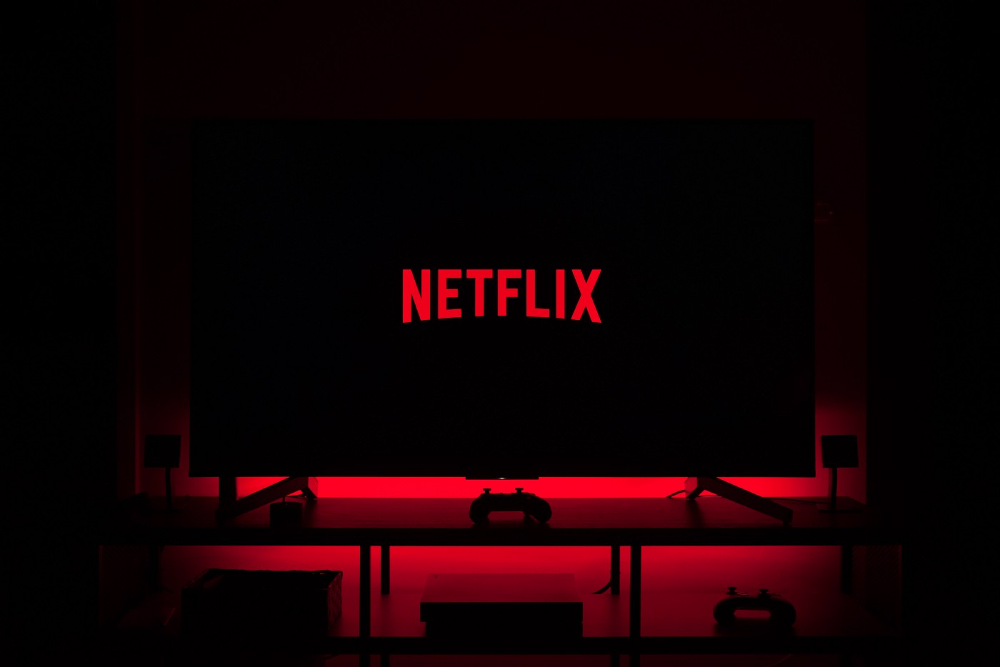

## 1. Importing libraries

In [1]:
import datetime
import seaborn as sns
import seaborn as sb
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd
import numpy as np
import folium
import math
import geopy
from folium.plugins import MarkerCluster
from pycountry_convert import country_name_to_country_alpha3, country_name_to_country_alpha2
from geopy.geocoders import Nominatim
from wordcloud import WordCloud 

### Reading Data

**Dataset**

The Netflix dataset contains around 9000 Netflix Shows and Movies. Each Movie or Tv Show is identified by:

show_id  → unique ID of each Movie or Tv Show

type  → variable standing for Movie or Tv Show

title →  the title of the content

director → name of the director

cast → list of main actors present in Movie or Tv Show

country → country of origin of the content

date_added  → when the content was added in Netflix catalogue

release_year  → year of content release

rating  → content rating as TV-MA or PG-13, etc.

duration  → either length of Movie or number of seasons in Tv Show

listed_in  → list of Movie or Tv Show genres

description → content description as available on Netflix website

In [2]:
df = pd.read_csv(r'C:\Users\CDMStudent14\Desktop\DSC-478\Project\netflix_titles.csv')
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,NaN,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm..."
1,s2,TV Show,Blood & Water,NaN,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",NaN,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...
3,s4,TV Show,Jailbirds New Orleans,NaN,NaN,NaN,"September 24, 2021",2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo..."
4,s5,TV Show,Kota Factory,NaN,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...


In [3]:
df.shape

(8807, 12)

## 2. Data Exploration

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8807 entries, 0 to 8806
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       8807 non-null   object
 1   type          8807 non-null   object
 2   title         8807 non-null   object
 3   director      6173 non-null   object
 4   cast          7982 non-null   object
 5   country       7976 non-null   object
 6   date_added    8797 non-null   object
 7   release_year  8807 non-null   int64 
 8   rating        8803 non-null   object
 9   duration      8804 non-null   object
 10  listed_in     8807 non-null   object
 11  description   8807 non-null   object
dtypes: int64(1), object(11)
memory usage: 825.8+ KB


### --> Checking for missing values

In [5]:
df.isna().sum()

show_id            0
type               0
title              0
director        2634
cast             825
country          831
date_added        10
release_year       0
rating             4
duration           3
listed_in          0
description        0
dtype: int64

In [6]:
print(df[df['duration'].isnull()])

     show_id   type                                 title    director  \
5541   s5542  Movie                       Louis C.K. 2017  Louis C.K.   
5794   s5795  Movie                 Louis C.K.: Hilarious  Louis C.K.   
5813   s5814  Movie  Louis C.K.: Live at the Comedy Store  Louis C.K.   

            cast        country          date_added  release_year  rating  \
5541  Louis C.K.  United States       April 4, 2017          2017  74 min   
5794  Louis C.K.  United States  September 16, 2016          2010  84 min   
5813  Louis C.K.  United States     August 15, 2016          2015  66 min   

     duration listed_in                                        description  
5541      NaN    Movies  Louis C.K. muses on religion, eternal love, gi...  
5794      NaN    Movies  Emmy-winning comedy writer Louis C.K. brings h...  
5813      NaN    Movies  The comic puts his trademark hilarious/thought...  


Text(0.5, 1.0, 'COLUMN WISE MISSING VALUES')

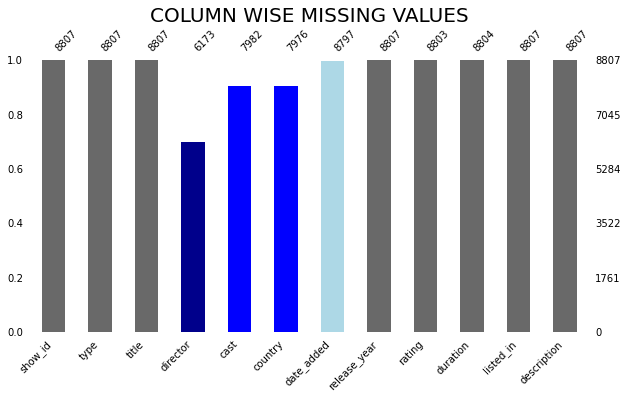

In [7]:
# Plot missing values in columns
import missingno #Python library for the exploratory visualization of missing data #install using !pip install missingno
color= ['dimgrey','dimgrey','dimgrey','darkblue','blue','blue','lightblue','dimgrey','dimgrey','dimgrey','dimgrey','dimgrey']
missingno.bar(df,fontsize=10,color=color,figsize=(10,5))
plt.title('COLUMN WISE MISSING VALUES',fontsize=20)

There are missing values in column director,cast,country and date_added.

We can't randomly fill the missing values in columns of director and cast, so we can drop them.

For minimal number of missing values in country and date_added,rating, we can fill them using mode(most common value) and mean.

### --> Handling missing values

In [8]:
df['country'] = df['country'].fillna(df['country'].mode()[0])
df['date_added'] = df['date_added'].fillna(df['date_added'].mode()[0])
df['rating'] = df['rating'].fillna(df['rating'].mode()[0])


In [9]:
df = df.dropna( how='any',subset=['cast', 'director','duration'])

In [10]:
df.isna().sum()

show_id         0
type            0
title           0
director        0
cast            0
country         0
date_added      0
release_year    0
rating          0
duration        0
listed_in       0
description     0
dtype: int64

All the missing values in the dataset have either been removed or filled. There are no missing values left.

In [11]:
df.duplicated().sum()

0

### --> Cleaning the data

Adding some new columns:

    listed_in - Genre
    Year Added - year_add
    Month Added - month_add
    Princial Country - country_main

In [12]:
#Rename the 'listed_in' column as 'Genre' for easy understanding
df = df.rename(columns={"listed_in":"Genre"})
df['Genre'] = df['Genre'].apply(lambda x: x.split(",")[0])
df['Genre'].head()

2              Crime TV Shows
5                   TV Dramas
6    Children & Family Movies
7                      Dramas
8            British TV Shows
Name: Genre, dtype: object

In [13]:
df['year_add'] = df['date_added'].apply(lambda x: x.split(" ")[-1])
df['year_add'].head()

2    2021
5    2021
6    2021
7    2021
8    2021
Name: year_add, dtype: object

In [14]:
df['month_add'] = df['date_added'].apply(lambda x: x.split(" ")[0])
df['month_add'].head()

2    September
5    September
6    September
7    September
8    September
Name: month_add, dtype: object

In [15]:
df['country_main'] = df['country'].apply(lambda x: x.split(",")[0])
df['country_main'].head()

2     United States
5     United States
6     United States
7     United States
8    United Kingdom
Name: country_main, dtype: object

In [16]:
df['type'].value_counts()

Movie      5519
TV Show     178
Name: type, dtype: int64

In [17]:
df['rating'].value_counts()

TV-MA       1940
TV-14       1329
R            789
PG-13        477
TV-PG        456
PG           279
TV-Y7        123
TV-Y         102
TV-G          96
NR            58
G             40
TV-Y7-FV       3
UR             3
NC-17          2
Name: rating, dtype: int64

--> **Making two new dataframes, one with movies collection and other with TV shows collection:**

    movie_df
    tv_df

In [18]:
movie_df = df[df['type'] == 'Movie']
tv_df = df[df['type'] == 'TV Show']

In [19]:
movie_df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,Genre,description,year_add,month_add,country_main
6,s7,Movie,My Little Pony: A New Generation,"Robert Cullen, José Luis Ucha","Vanessa Hudgens, Kimiko Glenn, James Marsden, ...",United States,"September 24, 2021",2021,PG,91 min,Children & Family Movies,Equestria's divided. But a bright-eyed hero be...,2021,September,United States
7,s8,Movie,Sankofa,Haile Gerima,"Kofi Ghanaba, Oyafunmike Ogunlano, Alexandra D...","United States, Ghana, Burkina Faso, United Kin...","September 24, 2021",1993,TV-MA,125 min,Dramas,"On a photo shoot in Ghana, an American model s...",2021,September,United States
9,s10,Movie,The Starling,Theodore Melfi,"Melissa McCarthy, Chris O'Dowd, Kevin Kline, T...",United States,"September 24, 2021",2021,PG-13,104 min,Comedies,A woman adjusting to life after a loss contend...,2021,September,United States
12,s13,Movie,Je Suis Karl,Christian Schwochow,"Luna Wedler, Jannis Niewöhner, Milan Peschel, ...","Germany, Czech Republic","September 23, 2021",2021,TV-MA,127 min,Dramas,After most of her family is murdered in a terr...,2021,September,Germany
13,s14,Movie,Confessions of an Invisible Girl,Bruno Garotti,"Klara Castanho, Lucca Picon, Júlia Gomes, Marc...",United States,"September 22, 2021",2021,TV-PG,91 min,Children & Family Movies,When the clever but socially-awkward Tetê join...,2021,September,United States


## 3. Exploratory Data Analysis
### --> Number of Movies vs TV Shows

<AxesSubplot:xlabel='type', ylabel='count'>

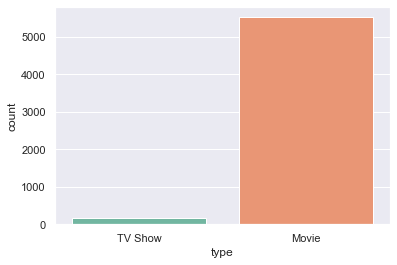

In [20]:
sb.set(style="darkgrid")
sb.countplot(x="type", data= df, palette="Set2")

    There are more Movies on Netflix than TV shows.

### --> Movies & TV Shows Ratings analysis

<AxesSubplot:xlabel='rating', ylabel='count'>

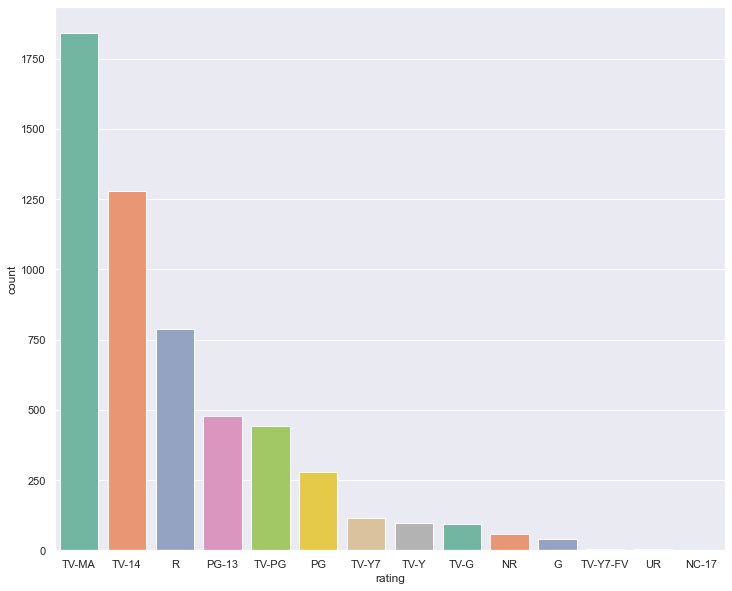

In [21]:
#MOVIES RATINGS
plt.figure(figsize=(12,10))
sb.set(style="darkgrid")
sb.countplot(x="rating", data= movie_df, palette="Set2", order=movie_df['rating'].value_counts().index[0:15])

The largest count of movies are made with the 'TV-MA' rating."TV-MA" is a rating assigned by the TV Parental Guidelines to a television program that was designed for mature audiences only.

Second largest is the 'TV-14' stands for content that may be inappropriate for children younger than 14 years of age.

Third largest is the very popular 'R' rating.An R-rated film is a film that has been assessed as having material which may be unsuitable for children under the age of 17.

<AxesSubplot:xlabel='rating', ylabel='count'>

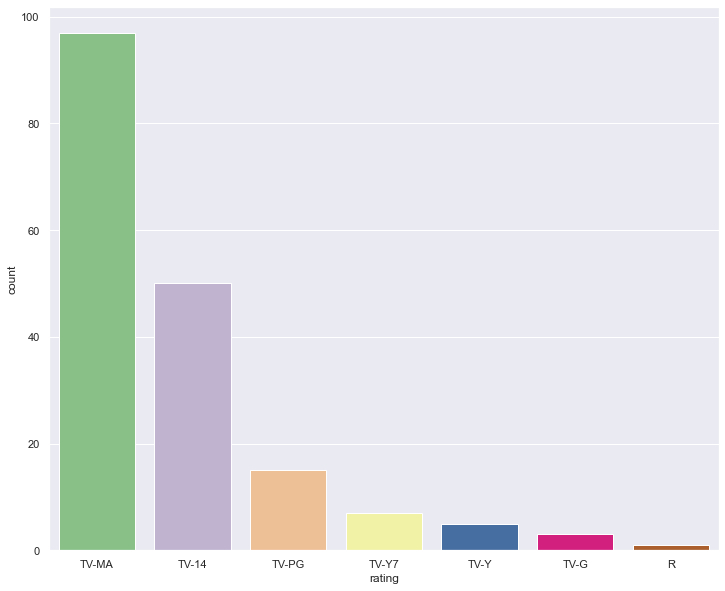

In [22]:
# TV SHOWS RATINGS
plt.figure(figsize=(12,10))
sb.set(style="darkgrid")
sb.countplot(x="rating", data=tv_df, palette="Accent", order=tv_df['rating'].value_counts().index[0:15])


Most of the TV Shows has 'TV-14' ratings which stands for the content can be inappropriate for children under 14 years of age.

Second highest count of ratings in TV Shows is 'TV-MA', for which the content is for matured audience only.

TV Shows has least amount of counts with 'R' ratings.

### --> Yearly Analysis of content

<AxesSubplot:xlabel='count', ylabel='release_year'>

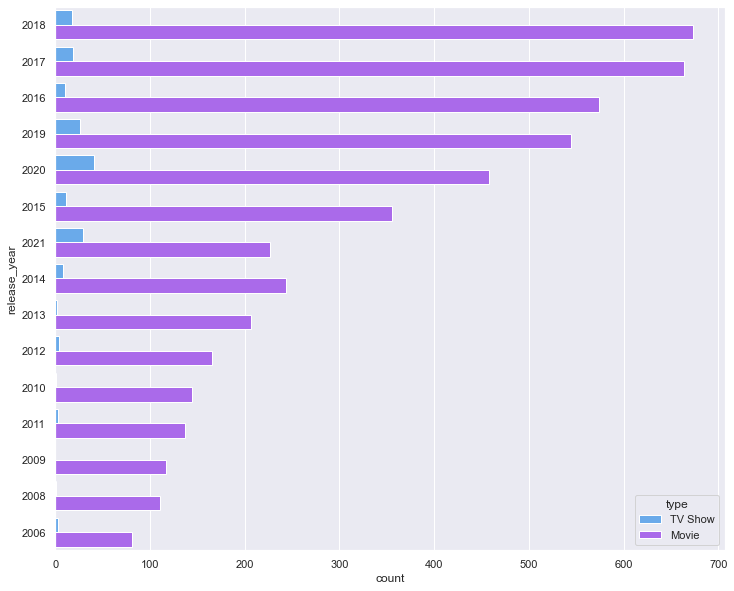

In [23]:
plt.figure(figsize=(12,10))
sb.set(style="darkgrid")
sb.countplot(y="release_year", data= df, palette="cool", order= df['release_year'].value_counts().index[0:15],hue=df['type'])


    We can see that Netflix released most number of content in year 2017.
    Noticeable growth in releasing content can be seen from the year 2015.

### --> Analysis of movies duration

In [24]:
movie_df['duration']=movie_df['duration'].str.replace(' min','')
movie_df['duration']=movie_df['duration'].astype(str).astype(int)
movie_df['duration']

C:\Users\CDMSTU~1\AppData\Local\Temp/ipykernel_13720/2105593385.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  movie_df['duration']=movie_df['duration'].str.replace(' min','')
C:\Users\CDMSTU~1\AppData\Local\Temp/ipykernel_13720/2105593385.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  movie_df['duration']=movie_df['duration'].astype(str).astype(int)


6        91
7       125
9       104
12      127
13       91
       ... 
8801     96
8802    158
8804     88
8805     88
8806    111
Name: duration, Length: 5519, dtype: int32

<AxesSubplot:xlabel='duration', ylabel='Density'>

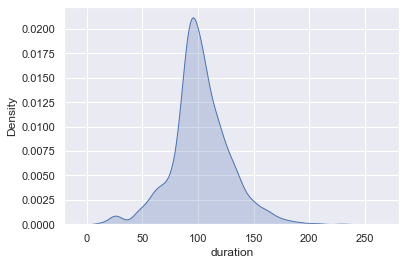

In [25]:
sb.set(style="darkgrid")
sb.kdeplot(data=movie_df['duration'], shade=True)

So, a good amount of movies on Netflix are among the duration of 75-130 mins.

### --> Trends of movies duration

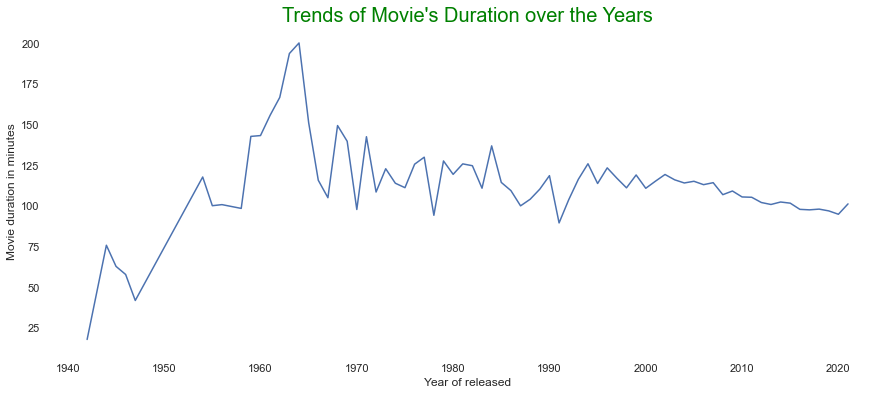

In [26]:
duration_year = movie_df.groupby(['release_year']).mean()
duration_year = duration_year.sort_index()

plt.figure(figsize=(15,6))
sb.lineplot(x=duration_year.index, y=duration_year.duration.values)
plt.box(on=None)
plt.ylabel('Movie duration in minutes');
plt.xlabel('Year of released');
plt.title("Trends of Movie's Duration over the Years", fontsize=20, color='Green');

In the years of 1960 to 1965, Movies durations were over 200 minutes, after 1965 the durations became comparitively shorter.

From the year 1980, we can see consistent trend of movie durations, of which duration time is around in between 100-150 minutes.

### --> Analysis of TV Shows with most number of seasons

In [27]:
tv_df['duration']=tv_df['duration'].str.replace(' Season','')
tv_df['duration']=tv_df['duration'].str.replace('s','')
tv_df['duration']=tv_df['duration'].astype(str).astype(int)
tv_df['duration']

C:\Users\CDMSTU~1\AppData\Local\Temp/ipykernel_13720/858091762.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tv_df['duration']=tv_df['duration'].str.replace(' Season','')
C:\Users\CDMSTU~1\AppData\Local\Temp/ipykernel_13720/858091762.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tv_df['duration']=tv_df['duration'].str.replace('s','')
C:\Users\CDMSTU~1\AppData\Local\Temp/ipykernel_13720/858091762.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

2       1
5       1
8       9
11      1
47      1
       ..
8172    1
8214    1
8293    1
8302    1
8599    3
Name: duration, Length: 178, dtype: int32

--> **Extract TV Shows titles and its number of seasons:**

In [28]:
#Extract the columns from tv_df
columns=['title','duration']
tv_shows = tv_df[columns]

In [29]:
#sort the dataframe by number of seasons
tv_shows = tv_shows.sort_values(by='duration',ascending=False)
tv_shows
top20 = tv_shows[0:20]
top20

,title,duration
2423,Supernatural,15
3541,Naruto,9
8,The Great British Baking Show,9
1998,Call the Midwife,9
2947,Arrow,8
7896,Royal Pains,8
380,The Flash,7
3653,Comedians in Cars Getting Coffee,6
1173,Men on a Mission,6
6742,Father Brown,6


<AxesSubplot:title={'center':'Number of seasons for each TV-show'}, xlabel='title'>

<Figure size 720x432 with 0 Axes>

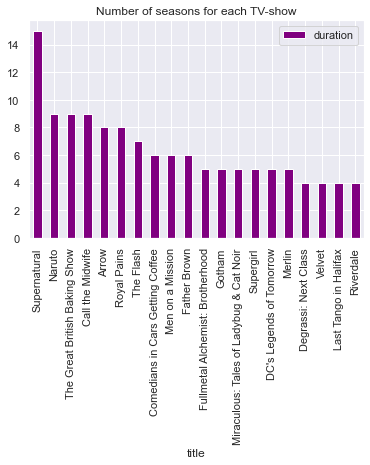

In [30]:
plt.figure(figsize=(10,6))
top20.plot(kind='bar',x='title',y='duration', color='purple', title='Number of seasons for each TV-show')

**Supernatural , Naruto** has the highest numbers of seasons

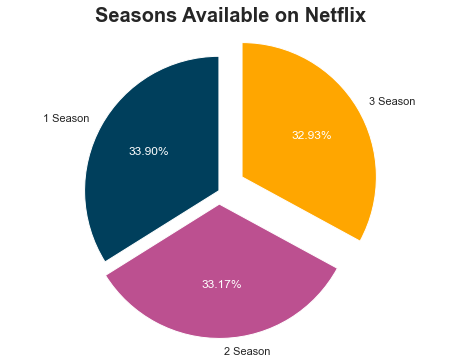

In [31]:
# TV SHOWS AND THEIR SEASONS
plt.figure(figsize=(8, 6))
labels=['1 Season', '2 Season', '3 Season']
_, _, texts = plt.pie(df.duration.value_counts()[:3], labels=labels, autopct='%1.2f%%', startangle=90, 
                      explode=(0.0, 0.1, 0.2), colors=['#003f5c', '#bc5090', '#ffa600'])
plt.axis('equal')
plt.title('Seasons Available on Netflix', fontsize=20, fontweight='bold');
for text in texts:
    text.set_color('white')

From the chart we can analyze, 35.04% TV Shows has only 1 Season,32.48% TV 

Shows has 2 seasons and 32.48% Tv Shows has 3 seasons available

### --> Countries on top for movies content creation

<AxesSubplot:xlabel='country_main', ylabel='count'>

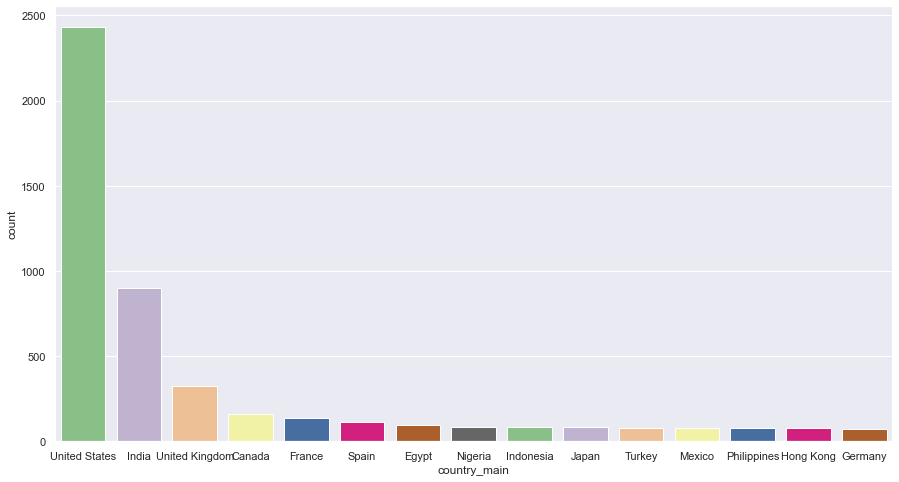

In [32]:
plt.figure(figsize=(15,8))
sb.set(style="darkgrid")
sb.countplot(x="country_main", data=movie_df, palette="Accent", order=movie_df['country_main'].value_counts().index[0:15])


United States creates highest amount of movies followed by **India and UK.**

### --> Countries on top for TV Show content creation

<AxesSubplot:xlabel='country_main', ylabel='count'>

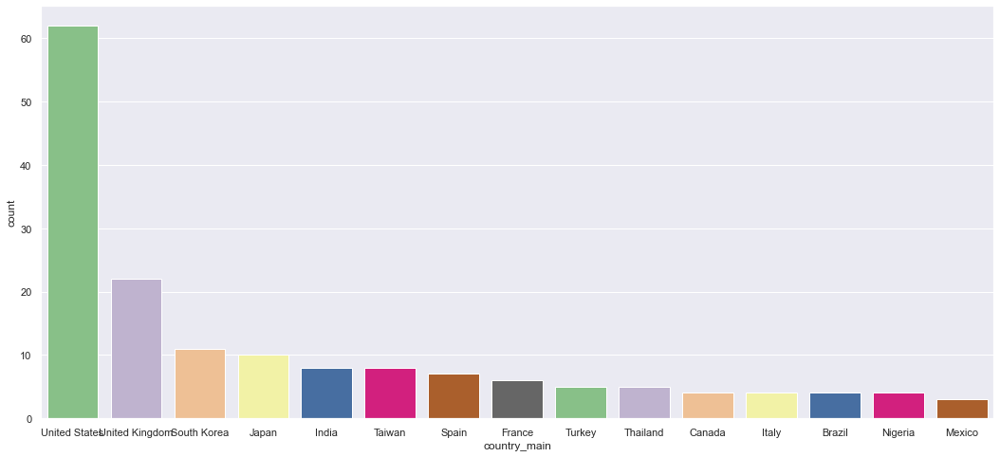

In [33]:
plt.figure(figsize=(18,8))
sb.set(style="darkgrid")
sb.countplot(x="country_main", data=tv_df, palette="Accent", order=tv_df['country_main'].value_counts().index[0:15])

**United States,United Kingdom,South Korea,Japan** creates most of the amount of TV Shows on netflix.

### -->Understanding what content is available in different countries

In [34]:
# Different Genres from Countries
columns=['Genre','country_main']
gen_country = df[columns]
gen_country.head()

,Genre,country_main
2,Crime TV Shows,United States
5,TV Dramas,United States
6,Children & Family Movies,United States
7,Dramas,United States
8,British TV Shows,United Kingdom


In [35]:
gen_country['Genre'].value_counts()

Dramas                          1586
Comedies                        1184
Action & Adventure               848
Children & Family Movies         548
Documentaries                    397
Stand-Up Comedy                  309
Horror Movies                    274
International Movies             122
Classic Movies                    73
Thrillers                         65
International TV Shows            59
Crime TV Shows                    37
Movies                            27
British TV Shows                  21
Independent Movies                20
Anime Features                    19
Music & Musicals                  18
Sci-Fi & Fantasy                  13
Cult Movies                       12
Anime Series                      11
Kids' TV                          11
Docuseries                        10
TV Shows                           9
Stand-Up Comedy & Talk Shows       8
Romantic Movies                    3
TV Comedies                        3
Classic & Cult TV                  2
T

In [36]:
size = gen_country['Genre'].value_counts().tolist()
size

[1586,
 1184,
 848,
 548,
 397,
 309,
 274,
 122,
 73,
 65,
 59,
 37,
 27,
 21,
 20,
 19,
 18,
 13,
 12,
 11,
 11,
 10,
 9,
 8,
 3,
 3,
 2,
 2,
 2,
 1,
 1,
 1,
 1]

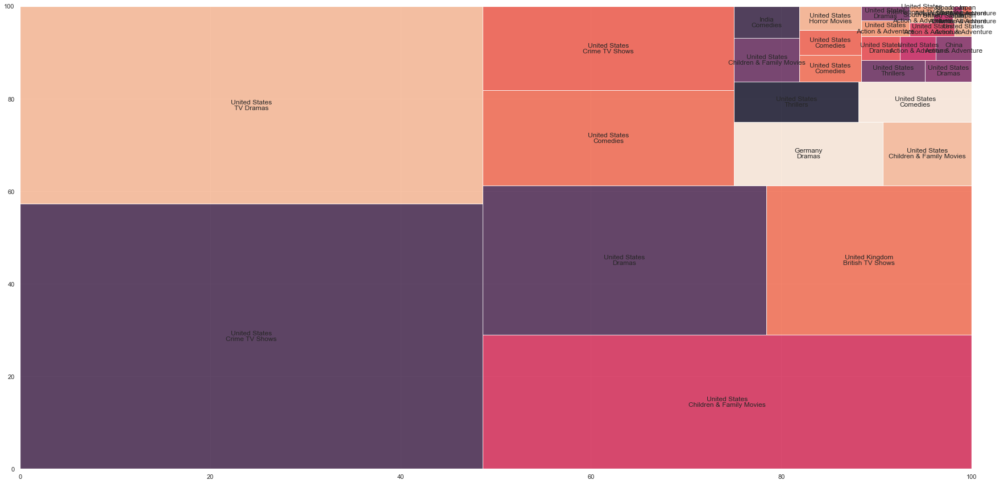

In [37]:
# GENRES BY COUNTRIES
import squarify
plt.figure(figsize=(30,15))
squarify.plot(value= gen_country['Genre'], label= gen_country['country_main'], sizes= size, alpha=0.8)
plt.rc('font', size=14)
plt.show()

    United states produces most amount of content in 'Comedies' and 'Childern & Family movies' Genres.

### --> Contents released by years

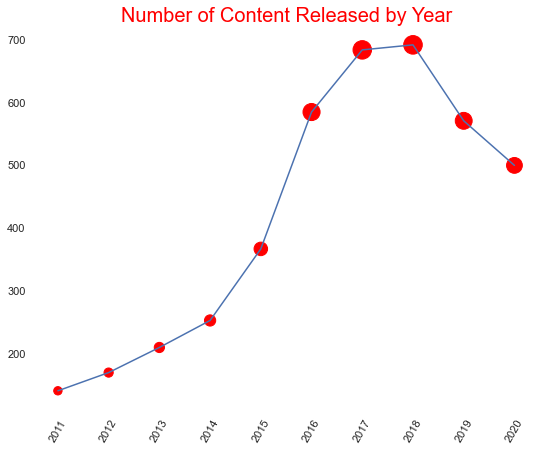

In [38]:
release = df['release_year'].value_counts()
release = release.sort_index(ascending=True)

plt.figure(figsize=(9,7))
plt.plot(release[-11:-1])
plt.scatter(release[-11:-1].index, release[-11:-1].values, s=0.5*release[-11:-1].values, c='Red');
plt.box(on=None);
plt.xticks(rotation = 60)
plt.xticks(release[-11:-1].index);
plt.title('Number of Content Released by Year', color='red', fontsize=20);

### --> Directors with most number of Movies produced

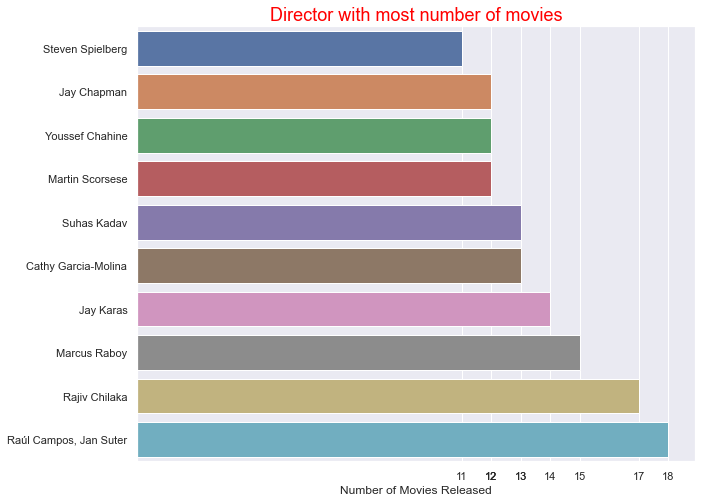

In [39]:
plt.figure(figsize=(10,8))
sb.barplot(y= movie_df.director.value_counts()[:10].sort_values().index, x=movie_df.director.value_counts()[:10].sort_values().values);
plt.title('Director with most number of movies', color='red', fontsize=18)
plt.xticks(movie_df.director.value_counts()[:10].sort_values().values);
plt.xlabel('Number of Movies Released');

**Director Raul Campos,Jan Suter** Produced highest number of movies: 18 on Netflix till now.

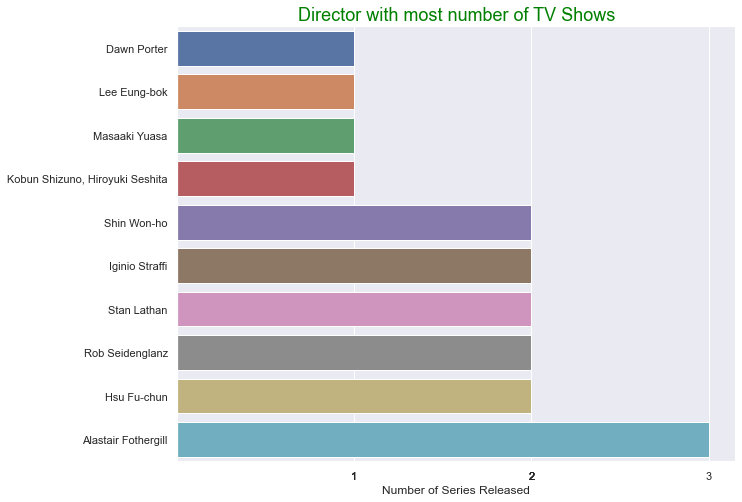

In [40]:
plt.figure(figsize=(10,8))
sb.barplot(y= tv_df.director.value_counts()[:10].sort_values().index, x=tv_df.director.value_counts()[:10].sort_values().values);
plt.title('Director with most number of TV Shows', color='green', fontsize=18)
plt.xticks(tv_df.director.value_counts()[:10].sort_values().values);
plt.xlabel('Number of Series Released');

Director **Alastair Fothergill** released highest number of TV shows:3 on Netflix.

### --> Most Popular Genre on Netflix

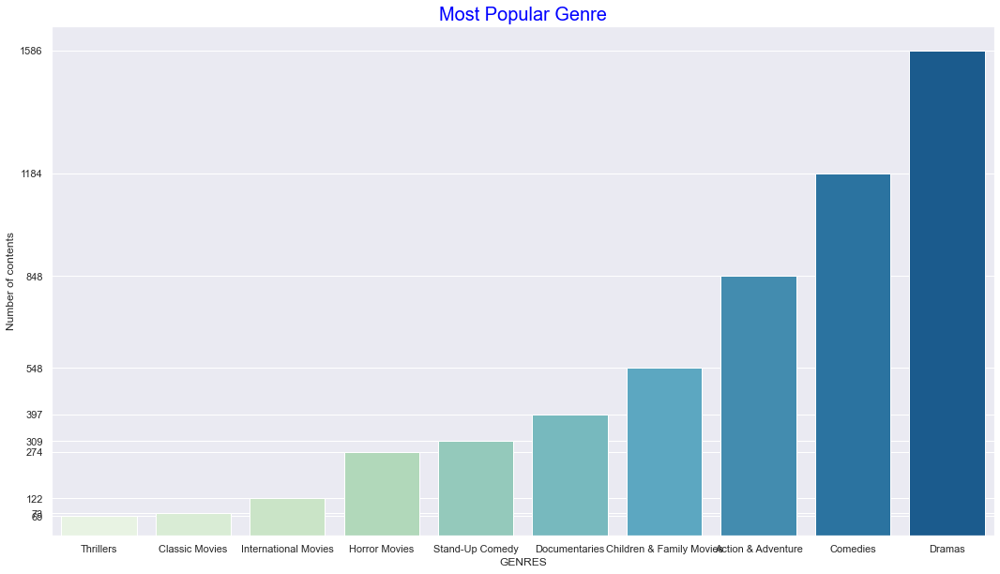

In [41]:
plt.figure(figsize=(18,10))
sb.barplot(x= df.Genre.value_counts()[:10].sort_values().index, y=df.Genre.value_counts()[:10].sort_values().values,palette='GnBu');
plt.title('Most Popular Genre', color='Blue', fontsize=20)
plt.yticks(df.Genre.value_counts()[:10].sort_values().values);
plt.xlabel('GENRES');
plt.ylabel('Number of contents');

(-0.5, 999.5, 399.5, -0.5)

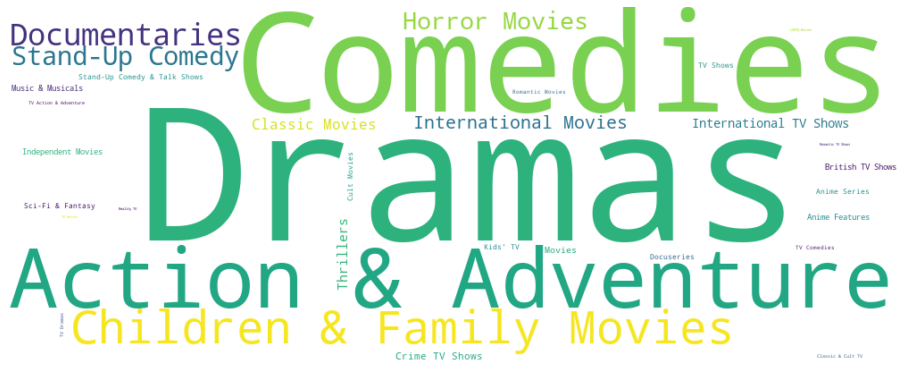

In [42]:
genre_wc = WordCloud(width=1000,height=400,background_color='white')
genre_wc.generate_from_frequencies(df["Genre"].value_counts().to_dict())
plt.figure(figsize=(16, 8))
#plt.title("GENERS",color='Black', fontsize=36)
plt.imshow(genre_wc, interpolation="bilinear")
plt.axis('off')

Netflix knows how much we all love **Comedy, Drama**

### --> Top Actor/Actresses on Netflix

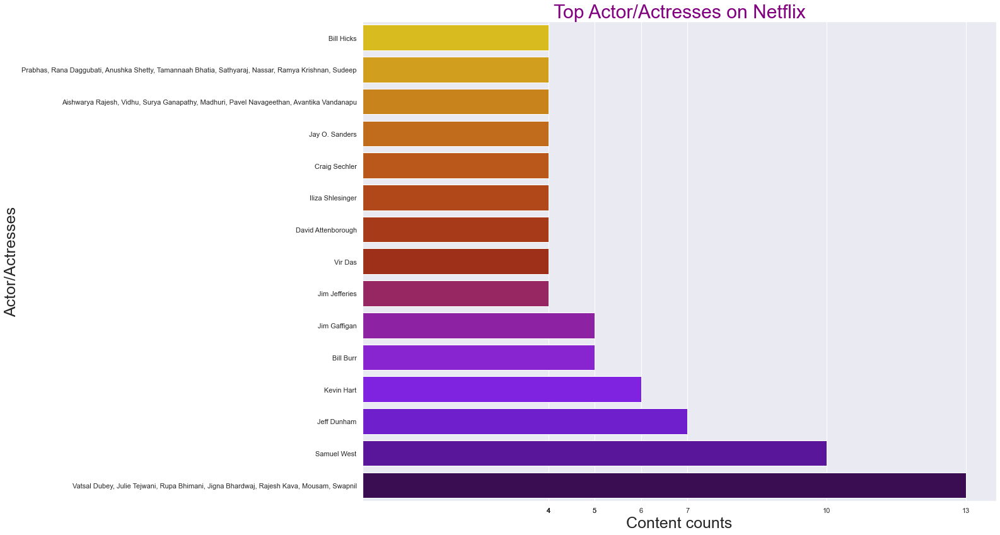

In [43]:
plt.figure(figsize=(18,14))
sb.barplot(y= df.cast.value_counts()[:15].sort_values().index, x=df.cast.value_counts()[:15].sort_values().values,palette='gnuplot_r');
plt.title('Top Actor/Actresses on Netflix', color='purple', fontsize=30)
plt.xticks(df.cast.value_counts()[:10].sort_values().values);
plt.ylabel('Actor/Actresses', fontsize=25);
plt.xlabel('Content counts', fontsize=25);

Actor **'Samuel West'** has highest number of movies/Tv shows on Netflix.

### --> Best Month for directors to release content


### We can analyse the months in which least amount of contents are added, that months can be best for directors to release their content for better audience attention.

In [44]:
df_copy = df.copy()
net_date = df_copy[['date_added']]
net_date['year'] = net_date['date_added'].apply(lambda x : x.split(', ')[-1])
net_date['month'] = net_date['date_added'].apply(lambda x : x.lstrip().split(' ')[0])

month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'][::-1]
df_copy = net_date.groupby('year')['month'].value_counts().unstack().fillna(0)[month_order].T

C:\Users\CDMSTU~1\AppData\Local\Temp/ipykernel_13720/1267995780.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  net_date['year'] = net_date['date_added'].apply(lambda x : x.split(', ')[-1])
C:\Users\CDMSTU~1\AppData\Local\Temp/ipykernel_13720/1267995780.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  net_date['month'] = net_date['date_added'].apply(lambda x : x.lstrip().split(' ')[0])


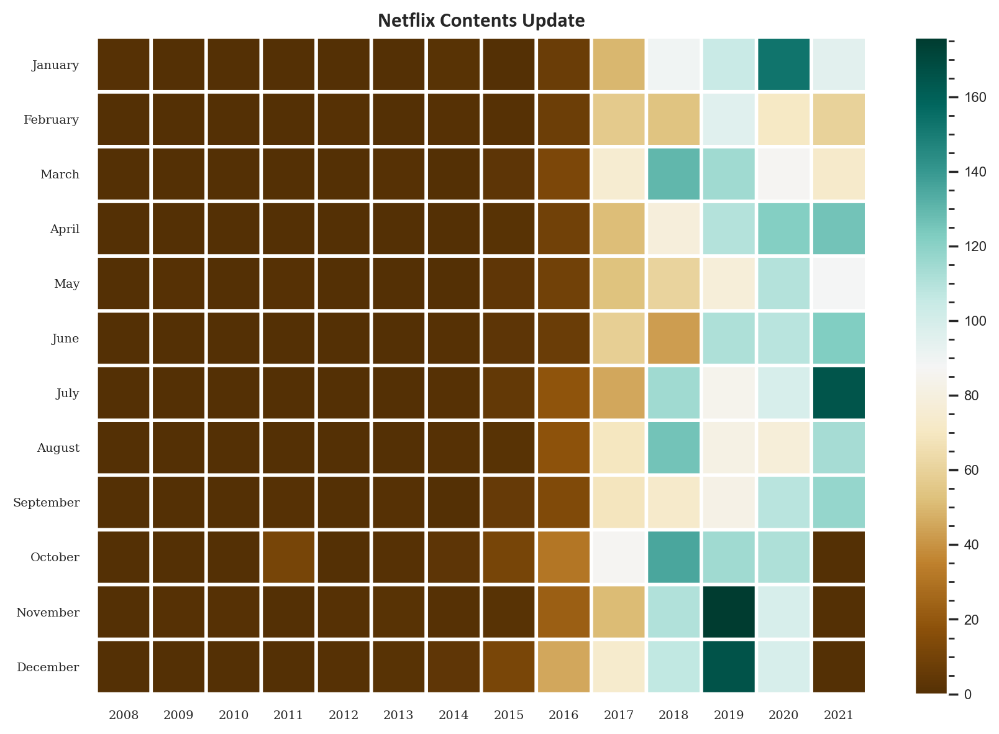

In [45]:
plt.figure(figsize=(10, 7), dpi=200)
plt.pcolor(df_copy, cmap='BrBG', edgecolors='white', linewidths=2) # heatmap
plt.xticks(np.arange(0.5, len(df_copy.columns), 1), df_copy.columns, fontsize=7, fontfamily='serif')
plt.yticks(np.arange(0.5, len(df_copy.index), 1), df_copy.index, fontsize=7, fontfamily='serif')

plt.title('Netflix Contents Update', fontsize=12, fontfamily='calibri', fontweight='bold')
cbar = plt.colorbar()
cbar.solids.set_edgecolor("face")

cbar.ax.tick_params(labelsize=8) 
cbar.ax.minorticks_on()
plt.show()

In [46]:
netflix =  pd.read_csv(r'C:\Users\CDMStudent14\Desktop\DSC-478\Project\netflix_titles.csv')

netflix = netflix.drop(['show_id','description'],axis=1)
netflix.date_added = pd.to_datetime(netflix.date_added)
netflix['month'] = netflix.date_added.dt.month
netflix['duration'] = netflix.duration.apply(lambda x : str(x).split("min")[0])
netflix['category'] = netflix.listed_in.apply(lambda x : x.split(",")[0])
netflix

,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,month,category
0,Movie,Dick Johnson Is Dead,Kirsten Johnson,NaN,United States,2021-09-25,2020,PG-13,90,Documentaries,9.0,Documentaries
1,TV Show,Blood & Water,NaN,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,2021-09-24,2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries",9.0,International TV Shows
2,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",NaN,2021-09-24,2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",9.0,Crime TV Shows
3,TV Show,Jailbirds New Orleans,NaN,NaN,NaN,2021-09-24,2021,TV-MA,1 Season,"Docuseries, Reality TV",9.0,Docuseries
4,TV Show,Kota Factory,NaN,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,2021-09-24,2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",9.0,International TV Shows
...,...,...,...,...,...,...,...,...,...,...,...,...
8802,Movie,Zodiac,David Fincher,"Mark Ruffalo, Jake Gyllenhaal, Robert Downey J...",United States,2019-11-20,2007,R,158,"Cult Movies, Dramas, Thrillers",11.0,Cult Movies
8803,TV Show,Zombie Dumb,NaN,NaN,NaN,2019-07-01,2018,TV-Y7,2 Seasons,"Kids' TV, Korean TV Shows, TV Comedies",7.0,Kids' TV
8804,Movie,Zombieland,Ruben Fleischer,"Jesse Eisenberg, Woody Harrelson, Emma Stone, ...",United States,2019-11-01,2009,R,88,"Comedies, Horror Movies",11.0,Comedies
8805,Movie,Zoom,Peter Hewitt,"Tim Allen, Courteney Cox, Chevy Chase, Kate Ma...",United States,2020-01-11,2006,PG,88,"Children & Family Movies, Comedies",1.0,Children & Family Movies


From the histplot it is clear that there are twice as many Movies as TV Shows with Movies almost representing the 70% of overall contents.

### Trend in Movie and Tv Show through years

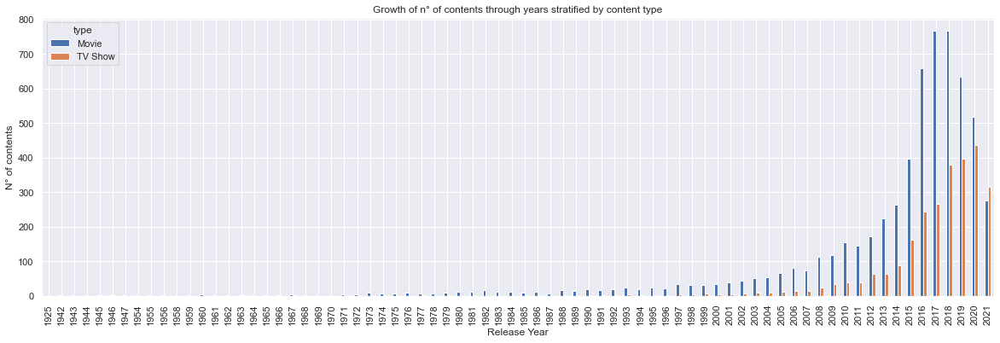

In [47]:
netflix.groupby(['release_year','type']).size().unstack().plot(
    kind='bar', 
    stacked=False, 
    figsize=(20, 6), 
    ylabel="N° of contents",
    xlabel="Release Year"
)
plt.title("Growth of n° of contents through years stratified by content type")
plt.show()

As we can see there is an increasing trend in uploaded content. Most of these are from the past 5 years. In addition, TV shows have experienced an increasing trend since the 2000s, surpassing movies in 2021.

### Country map (MarkerCluster)

In [48]:
def get_continent(col):
    try:
        cn_a3_code =  country_name_to_country_alpha3(col)
        cn_a2_code = country_name_to_country_alpha2(col)
    except:
        cn_a3_code = np.nan
        cn_a2_code = np.nan
        
    return (cn_a2_code, cn_a3_code)

geolocator = Nominatim(user_agent="https")

def geolocate(country):
    if country == np.nan:
        return np.nan
    else:
        try:
            loc = geolocator.geocode(country)
            return loc.latitude, loc.longitude
        except:
            return np.nan

In [49]:
netflix['alpha_2'] = netflix.country.apply(lambda x: get_continent(x)[0])
netflix['alpha_3'] = netflix.country.apply(lambda x: get_continent(x)[-1])
country_coord = {}

for country in netflix.alpha_2.unique().tolist():
    latitude, longitude = geolocate(country)
    country_coord[country] = [latitude, longitude]

for country in netflix.alpha_2.unique().tolist():
    netflix.loc[netflix['alpha_2'] == country, ['latitude','longitude']] = country_coord.get(country)[0],country_coord.get(country)[1]

In [50]:
world_map= folium.Map(tiles="cartodbpositron")
marker_cluster = MarkerCluster().add_to(world_map)
for i in range(len(netflix)):
    lat = netflix.iloc[i]['latitude']
    long = netflix.iloc[i]['longitude']
    if not np.isnan(lat):
        nation = netflix.iloc[i]['alpha_2']
        radius=5
        popup_text = """Country : {}<br>
                    Number of movies : {}<br>
                    Number of tv shows : {}<br>"""
        popup_text = popup_text.format(netflix.iloc[i]['country'],
                     netflix[['type','alpha_2']].groupby(['alpha_2','type']).size().unstack().loc[nation]['Movie'],
                     netflix[['type','alpha_2']].groupby(['alpha_2','type']).size().unstack().loc[nation]['TV Show'])
        folium.CircleMarker(location = [lat, long], radius=radius, popup= popup_text, fill =True).add_to(marker_cluster)

world_map

Country map gives us a clear vision of where Movies and Tv Shows come from. As we can see the majority of them are located in USA followed by Europe and Asia. Folium based on leaflet.js allows us to zoom in and have a more detailed view as JavaScript allows the map to be rendered dynamically.

### Country Map (Choropleth)

In [51]:
states = netflix.alpha_3.unique().tolist()
states.remove(np.nan)
states.sort()

contents = netflix.groupby('alpha_3').size().tolist()

state_data = pd.DataFrame(
    {
        "State" : states,
        "Contents" : contents,
    }
)

countries = gpd.read_file("https://raw.githubusercontent.com/johan/world.geo.json/master/countries.geo.json")
countries = countries.rename({"id" : "State"}, axis=1)
countries = state_data.merge(countries, on='State', how="right")



style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0.1, 
                            'weight': 0.1}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}

m = folium.Map(zoom_start=3)

folium.Choropleth(
    geo_data="https://raw.githubusercontent.com/johan/world.geo.json/master/countries.geo.json",
    name="choropleth",
    data=state_data,
    columns=["State", "Contents"],
    key_on="feature.id",
    bins=np.array([0,90,300,500,1000,2819]),
    fill_color="YlGnBu",
    fill_opacity=1,
    line_opacity=0.2,
    nan_fill_color="white",
    nan_fill_opacity=0.2,
    legend_name="N° of contents",
    highlight=True,
).add_to(m)

folium.features.GeoJson(
    gpd.GeoDataFrame(countries).to_json(),
    style_function=style_function, 
    control=False,
    highlight_function=highlight_function, 
    tooltip=folium.features.GeoJsonTooltip(
        fields=['name','Contents'],
        aliases=['Country: ','Contents: '],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;") 
    )
).add_to(m)

folium.LayerControl().add_to(m)

m

## 4. Netflix Recommendation System

## Content Based Filtering

For this recommender system the content of the movie (cast, description, director,genre etc) is used to find its similarity with other movies. Then the movies that are most likely to be similar are recommended.

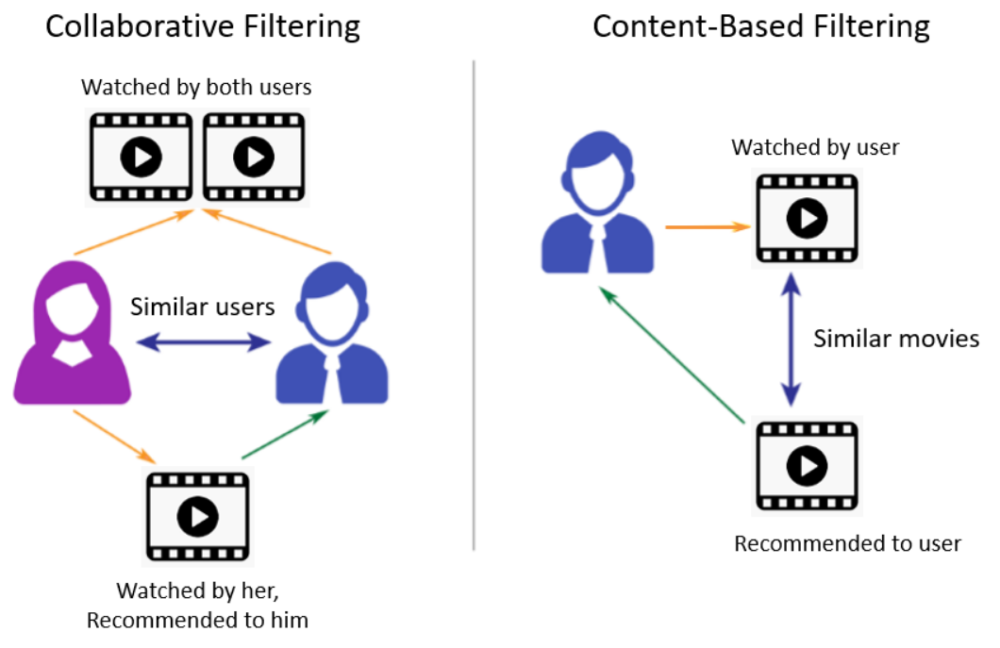

###            Plot description based Recommendation System

### We will calculate similarity scores for all movies based on their plot descriptions and recommend movies based on that similarity score. The plot description is given in the description feature of our dataset.

In [52]:
df['description'].head()

2    To protect his family from a powerful drug lor...
5    The arrival of a charismatic young priest brin...
6    Equestria's divided. But a bright-eyed hero be...
7    On a photo shoot in Ghana, an American model s...
8    A talented batch of amateur bakers face off in...
Name: description, dtype: object

We need to convert the word vector of each overview. We'll compute Term Frequency-Inverse Document Frequency (TF-IDF) vectors for each description. The overall importance of each word to the documents in which they appear is equal to TF * IDF.This is done to reduce the importance of words that occur frequently in plot overviews and therefore, their significance in computing the final similarity score.

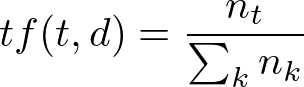

In [53]:
from sklearn.feature_extraction.text import TfidfVectorizer

#Define a TF-IDF Vectorizer Object. Remove all english stop words such as 'the', 'a'
tfidf = TfidfVectorizer(stop_words='english')

In [54]:
#Replace NaN with an empty string
df['description'] = df['description'].fillna('')

#Construct the required TF-IDF matrix by fitting and transforming the data
tfidf_matrix = tfidf.fit_transform(df['description'])

#Output the shape of tfidf_matrix
tfidf_matrix.shape

(5697, 14765)

#### Since we have used the TF-IDF vectorizer, calculating the dot product will directly give us the cosine similarity score.

In [55]:
# Import linear_kernel
from sklearn.metrics.pairwise import linear_kernel
from sklearn.metrics.pairwise import cosine_similarity

# Compute the cosine similarity matrix
cosine_sim = linear_kernel(tfidf_matrix, tfidf_matrix)

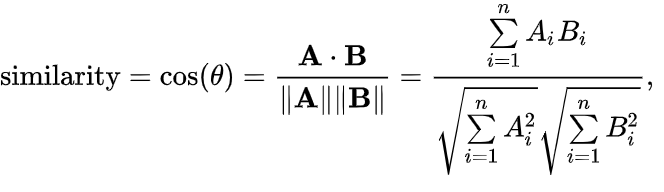

##### -- we need a mechanism to identify the index of a movie in our metadata DataFrame, given its title.

In [56]:
#Construct a reverse map of indices and movie titles
indices = pd.Series(df.index, index=df['title']).drop_duplicates()

#### -- Let's define a function that takes in a movie title as an input and outputs a list of the 10 most similar movies.

In [57]:
def get_recommendations(title, cosine_sim=cosine_sim):
    idx = indices[title]
    
    # Get the pairwsie similarity scores of all movies with that movie
    sim_scores = list(enumerate(cosine_sim[idx]))

    # Sort the movies based on the similarity scores
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)

    # Get the scores of the 10 most similar movies
    sim_scores = sim_scores[1:11]

    # Get the movie indices
    movie_indices = [i[0] for i in sim_scores]

    # Return the top 10 most similar movies
    return df['title'].iloc[movie_indices]

## Stage 1 Recommendations System

In [58]:
get_recommendations('#realityhigh')


7034               Hypersomnia
7445                  Merantau
3233                   Pranaam
8146      Take Me Home Tonight
7939      Sarvopari Palakkaran
1896                   Òlòtūré
4888                      Darc
8586                   Thumper
8622    Tremors 2: Aftershocks
2721                    Duniya
Name: title, dtype: object

In [59]:
get_recommendations('PK')

6592                                  Den of Thieves
3494                         Inside Man: Most Wanted
6467                                     Chief Daddy
2117                          Crazy Awesome Teachers
8665                                            Urvi
7137                                        John Day
58      Naruto Shippûden the Movie: The Will of Fire
2375                                 The Blazing Sun
195                  EMI: Liya Hai To Chukana Padega
2424                 The Last Days of American Crime
Name: title, dtype: object

### Multiple metrics(Genre,cast,director) based Recommendation System

In [60]:
features=['Genre','director','cast','description','title','rating']
filters = df[features]

In [61]:
#Cleaning the data by making all the words in lower case.
def clean_data(x):
        return str.lower(x.replace(" ", ""))

In [62]:
for feature in features:
    filters[feature] = filters[feature].apply(clean_data)
    
filters.head()

C:\Users\CDMSTU~1\AppData\Local\Temp/ipykernel_13720/319460688.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filters[feature] = filters[feature].apply(clean_data)


,Genre,director,cast,description,title,rating
2,crimetvshows,julienleclercq,"samibouajila,tracygotoas,samueljouy,nabihaakka...","toprotecthisfamilyfromapowerfuldruglord,skille...",ganglands,tv-ma
5,tvdramas,mikeflanagan,"katesiegel,zachgilford,hamishlinklater,henryth...",thearrivalofacharismaticyoungpriestbringsglori...,midnightmass,tv-ma
6,children&familymovies,"robertcullen,joséluisucha","vanessahudgens,kimikoglenn,jamesmarsden,sofiac...",equestria'sdivided.butabright-eyedherobelieves...,mylittlepony:anewgeneration,pg
7,dramas,hailegerima,"kofighanaba,oyafunmikeogunlano,alexandraduah,n...","onaphotoshootinghana,anamericanmodelslipsbacki...",sankofa,tv-ma
8,britishtvshows,andydevonshire,"melgiedroyc,sueperkins,maryberry,paulhollywood",atalentedbatchofamateurbakersfaceoffina10-week...,thegreatbritishbakingshow,tv-14


We can now create our "metadata soup", which is a string that contains all the metadata that we want to feed to our vectorizer.

In [63]:
def create_soup(x):
    return x['director'] + ' ' + x['cast'] + ' ' +x['Genre']+' '+ x['description']+ ' '+x['rating']
filters['soup'] = filters.apply(create_soup, axis=1)

C:\Users\CDMSTU~1\AppData\Local\Temp/ipykernel_13720/2852577251.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filters['soup'] = filters.apply(create_soup, axis=1)


The next steps are the same as what we did with our plot description based recommender. One important difference is that we use the CountVectorizer() instead of TF-IDF. 

In [64]:
# Import CountVectorizer and create the count matrix
from sklearn.feature_extraction.text import CountVectorizer

count = CountVectorizer(stop_words='english')
count_matrix = count.fit_transform(filters['soup'])
# Compute the Cosine Similarity matrix based on the count_matrix
from sklearn.metrics.pairwise import cosine_similarity

cosine_sim2 = cosine_similarity(count_matrix, count_matrix)
filters

,Genre,director,cast,description,title,rating,soup
2,crimetvshows,julienleclercq,"samibouajila,tracygotoas,samueljouy,nabihaakka...","toprotecthisfamilyfromapowerfuldruglord,skille...",ganglands,tv-ma,"julienleclercq samibouajila,tracygotoas,samuel..."
5,tvdramas,mikeflanagan,"katesiegel,zachgilford,hamishlinklater,henryth...",thearrivalofacharismaticyoungpriestbringsglori...,midnightmass,tv-ma,"mikeflanagan katesiegel,zachgilford,hamishlink..."
6,children&familymovies,"robertcullen,joséluisucha","vanessahudgens,kimikoglenn,jamesmarsden,sofiac...",equestria'sdivided.butabright-eyedherobelieves...,mylittlepony:anewgeneration,pg,"robertcullen,joséluisucha vanessahudgens,kimik..."
7,dramas,hailegerima,"kofighanaba,oyafunmikeogunlano,alexandraduah,n...","onaphotoshootinghana,anamericanmodelslipsbacki...",sankofa,tv-ma,"hailegerima kofighanaba,oyafunmikeogunlano,ale..."
8,britishtvshows,andydevonshire,"melgiedroyc,sueperkins,maryberry,paulhollywood",atalentedbatchofamateurbakersfaceoffina10-week...,thegreatbritishbakingshow,tv-14,"andydevonshire melgiedroyc,sueperkins,maryberr..."
...,...,...,...,...,...,...,...
8801,dramas,majidalansari,"alisuliman,salehbakri,yasa,alial-jabri,mansoor...",recoveringalcoholictalalwakesupinsideasmall-to...,zinzana,tv-ma,"majidalansari alisuliman,salehbakri,yasa,alial..."
8802,cultmovies,davidfincher,"markruffalo,jakegyllenhaal,robertdowneyjr.,ant...","apoliticalcartoonist,acrimereporterandapairofc...",zodiac,r,"davidfincher markruffalo,jakegyllenhaal,robert..."
8804,comedies,rubenfleischer,"jesseeisenberg,woodyharrelson,emmastone,abigai...","lookingtosurviveinaworldtakenoverbyzombies,ado...",zombieland,r,"rubenfleischer jesseeisenberg,woodyharrelson,e..."
8805,children&familymovies,peterhewitt,"timallen,courteneycox,chevychase,katemara,ryan...","draggedfromcivilianlife,aformersuperheromusttr...",zoom,pg,"peterhewitt timallen,courteneycox,chevychase,k..."


In [65]:
# Reset index of our main DataFrame and construct reverse mapping as before
filters=filters.reset_index()
indices = pd.Series(filters.index, index=filters['title'])

In [66]:
len(filters)

5697

In [67]:
x=[]
for i in df.title :
    x.append(i)

In [68]:
age_dict = {'TV-MA': 18 ,'TV-14':16, 'R': 18, 'PG-13': 13, 'TV-PG':7, 'PG': 7, 'TV-Y7': 7,'TV-Y': 0, 'TV-G': 0 ,'NR': 18, 'G': 0,'TV-Y7-FV': 7, 'UR':14,'NC-17':18}

In [69]:
def get_recommendations_new(titles,user_age,cosine_sim=cosine_sim):
        
        try:
            titles=titles.replace(' ','').lower()
            idx = indices[titles] #from this we well get the index of that title in the data set.
             
            
            age_rating = df['rating'][idx] #from this we get movie rating for age restriction
            age_req = age_dict[age_rating] 

            if(age_req <= user_age): # comparies user age to required age to watch movie
                
                # Get the pairwsie similarity scores of all movies with that movie
                sim_scores = list(enumerate(cosine_sim[idx]))

                # Sort the movies based on the similarity scores
                sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)

                # Get the scores of the 10 most similar movies
                sim_scores = sim_scores[1:11]

                # Get the movie indices
                movie_indices = [i[0] for i in sim_scores]

                # Return the top 10 most similar movies
                print("These are Recommended movies based upon your last watch")
                p = df['title'].iloc[movie_indices]
            else:
                p = print('Your age should be: ',age_req,' but your age is: ', user_age," try with other movies")
            return  p
        
        except KeyError:
            words = [titles]
            global i
            i = 0
            def check_all(sentence, ws):
                return all(w in sentence for w in ws)

            for sentence in x:
                if any(check_all(sentence.lower(), word.split(' ')) for word in words):
                    print(sentence)
                    i = 1
            if i>0:
                print("\n","your title matches to these movie name, you can try these suggestions\n")
            else:
                print("entered movie is not at updated or Spelling mistake happened")
            return "Please try with different Name"

## Stage 2 Recommendations System

In [70]:
get_recommendations_new('The Idhun Chronicles',12, cosine_sim2)

Your age should be:  18  but your age is:  12  try with other movies


In [71]:
get_recommendations_new('Shopkins: Chef Club',18, cosine_sim2)

These are Recommended movies based upon your last watch


8007                             Shopkins: World Vacation
8006                                       Shopkins: Wild
308              American Masters: Inventing David Geffen
2909                            Monster High: Electrified
4893                            Pocoyo & The Space Circus
7618                        Nova: Ultimate Mars Challenge
2858    Calico Critters: Everyone's Big Dream Flying i...
7277                               LeapFrog: Phonics Farm
8759                               World's Weirdest Homes
5876                         Marco Polo: One Hundred Eyes
Name: title, dtype: object

In [72]:
get_recommendations_new('tru',18, cosine_sim2)

Intrusion
Janoskians: Untold and Untrue
Truckbhar Swapna
Sword of Trust
The Whole Truth
A Trash Truck Christmas
True: Friendship Day
High Strung Free Dance
A truthful Mother
True: Wuzzle Wegg Day
EVANGELION: DEATH (TRUE)²
In Family I Trust
Await Further Instructions
Truth or Dare
Rodney Carrington: Here Comes the Truth
Buddy Thunderstruck: The Maybe Pile
True Memoirs of an International Assassin
Agatha and the Truth of Murder
Avicii: True Stories
Instructions Not Included
Mr. Gaga: A True Story of Love and Dance
My True Friend
Strange but True
The Trust
The Truth About Alcohol
The Ugly Truth
True Grit
True to the Game
Trumbo

 your title matches to these movie name, you can try these suggestions



'Please try with different Name'

In [73]:
get_recommendations_new('intrusion',12, cosine_sim2)

Your age should be:  13  but your age is:  12  try with other movies


In [74]:
get_recommendations_new('hell Boy',18, cosine_sim2)

These are Recommended movies based upon your last watch


7070    Indiana Jones and the Kingdom of the Crystal S...
7966                                  Season of the Witch
2059                                               Adrift
8025                                          Singularity
949                                      The Darkest Hour
6427                                        Casino Royale
8032                                            Skiptrace
8512                                 The Space Between Us
143                                         Green Lantern
4484                       Scorpion King 5: Book of Souls
Name: title, dtype: object

In [75]:
get_recommendations_new('Get on Up',19, cosine_sim2)

These are Recommended movies based upon your last watch


8341                        The Help
1243                  Black or White
1387             The Next Three Days
6637                           Doubt
6991        Honey: Rise Up and Dance
171     Same Kind of Different as Me
3116                   The Two Popes
4829                Sunday's Illness
6664                   Eat Pray Love
162                         Marshall
Name: title, dtype: object

In [76]:
get_recommendations_new('Iron',18, cosine_sim2)

Iron Cowboy: The Story of the 50.50.50
Iron Man & Captain America: Heroes United
Marvel's Iron Man & Hulk: Heroes United
The Iron Lady

 your title matches to these movie name, you can try these suggestions



'Please try with different Name'

In [77]:
get_recommendations_new('Iron Cowboy: The Story of the 50.50.50',18, cosine_sim2)

These are Recommended movies based upon your last watch


634                                            Wonder Boy
1438                          Tony Parker: The Final Shot
1882                              Dolly Parton: Here I Am
3278                                            SunGanges
3514                                Steal a Pencil for Me
4768                                    Camarón: The Film
5912     The Other One: The Long Strange Trip of Bob Weir
6140               American Experience: The Island Murder
6195    Attacking the Devil: Harold Evans and the Last...
6355                     Bombshell: The Hedy Lamarr Story
Name: title, dtype: object

In [78]:
get_recommendations_new('attack',14, cosine_sim2)

Mars Attacks!
Mobile Suit Gundam: Char's Counterattack
Attacking the Devil: Harold Evans and the Last Nazi War Crime

 your title matches to these movie name, you can try these suggestions



'Please try with different Name'

In [79]:
get_recommendations_new('3',14, cosine_sim2)

Jaws 3
InuYasha the Movie 3: Swords of an Honorable Ruler
Naruto the Movie 3: Guardians of the Crescent Moon Kingdom
House Party 3
Kyaa Kool Hain Hum 3
The Kissing Booth 3
Fear Street Part 3: 1666
Kambili: The Whole 30 Yards
Population 436
Madagascar 3: Europe's Most Wanted
Motu Patlu in Hong Kong: Kung Fu Kings 3
3 Idiots
Case 39
3 Days to Kill
Before 30
TE3N
High & Low The Movie 3 / Final Mission
Class of '83
Sam Jay: 3 In The Morning
365 Days
Si Doel the Movie 3
Jerry Seinfeld: 23 Hours To Kill
3022
93 Days
37 Seconds
Guna 369
The 3rd Eye 2
23:59
The 3rd Eye
Lupin the 3rd: The Castle of Cagliostro: Special Edition
Neal Brennan: 3 Mics
3 Türken & ein Baby
Ip Man 3
13 Cameras
13 Sins
2036 Origin Unknown
2307: Winter's Dream
3 Deewarein
3 Generations
3 Heroines
30 Days of Luxury
30 Minutes or Less
300 Miles to Heaven
Balto 3: Wings of Change
Disciples Of The 36th Chamber
Dragonheart 3: The Sorcerer
Eyyvah Eyyvah 3
Final Destination 3
Friday the 13th
Holy Man 3
Hotel Transylvania 3: Sum

'Please try with different Name'

In [80]:
get_recommendations_new('Naruto',19, cosine_sim2)

These are Recommended movies based upon your last watch


56               Naruto Shippuden the Movie: Blood Prison
7559                      Naruto Shippuden : Blood Prison
57                      Naruto Shippûden the Movie: Bonds
58           Naruto Shippûden the Movie: The Will of Fire
63      Naruto the Movie: Ninja Clash in the Land of Snow
621                                    Legend of Exorcism
62      Naruto the Movie 3: Guardians of the Crescent ...
59                            Naruto Shippuden: The Movie
60            Naruto Shippuden: The Movie: The Lost Tower
1432                                 The Idhun Chronicles
Name: title, dtype: object

In [81]:
get_recommendations_new('Naruto Shippuden: The Movie: The Lost Tower',18, cosine_sim2)

These are Recommended movies based upon your last watch


56               Naruto Shippuden the Movie: Blood Prison
7559                      Naruto Shippuden : Blood Prison
58           Naruto Shippûden the Movie: The Will of Fire
57                      Naruto Shippûden the Movie: Bonds
4339                                               Faraar
8666                                           Used Goods
61       Naruto the Movie 2: Legend of the Stone of Gelel
7090    InuYasha: The Movie 2: The Castle Beyond the L...
1080                               New Gods: Nezha Reborn
4442                                           Himmatwala
Name: title, dtype: object

# KMeans clustering with TF-IDF

In [82]:
df_k = pd.read_csv(r'C:\Users\CDMStudent14\Desktop\DSC-478\Project\netflix_titles.csv')
df_k

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,NaN,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm..."
1,s2,TV Show,Blood & Water,NaN,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",NaN,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...
3,s4,TV Show,Jailbirds New Orleans,NaN,NaN,NaN,"September 24, 2021",2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo..."
4,s5,TV Show,Kota Factory,NaN,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...
...,...,...,...,...,...,...,...,...,...,...,...,...
8802,s8803,Movie,Zodiac,David Fincher,"Mark Ruffalo, Jake Gyllenhaal, Robert Downey J...",United States,"November 20, 2019",2007,R,158 min,"Cult Movies, Dramas, Thrillers","A political cartoonist, a crime reporter and a..."
8803,s8804,TV Show,Zombie Dumb,NaN,NaN,NaN,"July 1, 2019",2018,TV-Y7,2 Seasons,"Kids' TV, Korean TV Shows, TV Comedies","While living alone in a spooky town, a young g..."
8804,s8805,Movie,Zombieland,Ruben Fleischer,"Jesse Eisenberg, Woody Harrelson, Emma Stone, ...",United States,"November 1, 2019",2009,R,88 min,"Comedies, Horror Movies",Looking to survive in a world taken over by zo...
8805,s8806,Movie,Zoom,Peter Hewitt,"Tim Allen, Courteney Cox, Chevy Chase, Kate Ma...",United States,"January 11, 2020",2006,PG,88 min,"Children & Family Movies, Comedies","Dragged from civilian life, a former superhero..."


In [83]:
# convert to datetime
df_k["date_added"] = pd.to_datetime(df_k['date_added'])
df_k['year'] = df_k['date_added'].dt.year
df_k['month'] = df_k['date_added'].dt.month
df_k['day'] = df_k['date_added'].dt.day
# convert columns "director, listed_in, cast and country" in columns that contain a real list
# the strip function is applied on the elements
# if the value is NaN, the new column contains a empty list []
df_k['directors'] = df_k['director'].apply(lambda l: [] if pd.isna(l) else [i.strip() for i in l.split(",")])
df_k['categories'] = df_k['listed_in'].apply(lambda l: [] if pd.isna(l) else [i.strip() for i in l.split(",")])
df_k['actors'] = df_k['cast'].apply(lambda l: [] if pd.isna(l) else [i.strip() for i in l.split(",")])
df_k['countries'] = df_k['country'].apply(lambda l: [] if pd.isna(l) else [i.strip() for i in l.split(",")])

df_k.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,year,month,day,directors,categories,actors,countries
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,NaN,United States,2021-09-25,2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm...",2021.0,9.0,25.0,[Kirsten Johnson],[Documentaries],[],[United States]
1,s2,TV Show,Blood & Water,NaN,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,2021-09-24,2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t...",2021.0,9.0,24.0,[],"[International TV Shows, TV Dramas, TV Mysteries]","[Ama Qamata, Khosi Ngema, Gail Mabalane, Thaba...",[South Africa]
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",NaN,2021-09-24,2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...,2021.0,9.0,24.0,[Julien Leclercq],"[Crime TV Shows, International TV Shows, TV Ac...","[Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nab...",[]
3,s4,TV Show,Jailbirds New Orleans,NaN,NaN,NaN,2021-09-24,2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo...",2021.0,9.0,24.0,[],"[Docuseries, Reality TV]",[],[]
4,s5,TV Show,Kota Factory,NaN,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,2021-09-24,2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...,2021.0,9.0,24.0,[],"[International TV Shows, Romantic TV Shows, TV...","[Mayur More, Jitendra Kumar, Ranjan Raj, Alam ...",[India]


In [84]:
df_k.shape

(8807, 19)

In [85]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import linear_kernel
from sklearn.cluster import MiniBatchKMeans
import time 
# Build the tfidf matrix with the descriptions
start_time = time.time()
text_content = df_k['description']
vector = TfidfVectorizer(max_df=0.4,         # drop words that occur in more than X percent of documents
                             min_df=1,      # only use words that appear at least X times
                             stop_words='english', # remove stop words
                             lowercase=True, # Convert everything to lower case 
                             use_idf=True,   # Use idf
                             norm=u'l2',     # Normalization
                             smooth_idf=True # Prevents divide-by-zero errors
                            )
tfidf = vector.fit_transform(text_content)

# Clustering  Kmeans
k = 200
kmeans = MiniBatchKMeans(n_clusters = k)
kmeans.fit(tfidf)
centers = kmeans.cluster_centers_.argsort()[:,::-1]
terms = vector.get_feature_names()

request_transform = vector.transform(df_k['description'])
# new column cluster based on the description
df_k['cluster'] = kmeans.predict(request_transform) 

df_k['cluster'].value_counts().head()

C:\Users\CDMStudent14\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


159    6573
94      748
66      672
195     258
144     131
Name: cluster, dtype: int64

In [86]:
# Find similar : get the top_n movies with description similar to the target description 
def find_similar(tfidf_matrix, index, top_n = 5):
    cosine_similarities = linear_kernel(tfidf_matrix[index:index+1], tfidf_matrix).flatten()
    related_docs_indices = [i for i in cosine_similarities.argsort()[::-1] if i != index]
    return [index for index in related_docs_indices][0:top_n] 

In [87]:
import networkx as nx
G = nx.Graph(label="MOVIE")
start_time = time.time()
for i, rowi in df_k.iterrows():
    if (i%1000==0):
        print(" iter {} -- {} seconds --".format(i,time.time() - start_time))
    G.add_node(rowi['title'],key=rowi['show_id'],label="MOVIE",mtype=rowi['type'],rating=rowi['rating'])
#    G.add_node(rowi['cluster'],label="CLUSTER")
#    G.add_edge(rowi['title'], rowi['cluster'], label="DESCRIPTION")
    for element in rowi['actors']:
        G.add_node(element,label="PERSON")
        G.add_edge(rowi['title'], element, label="ACTED_IN")
    for element in rowi['categories']:
        G.add_node(element,label="CAT")
        G.add_edge(rowi['title'], element, label="CAT_IN")
    for element in rowi['directors']:
        G.add_node(element,label="PERSON")
        G.add_edge(rowi['title'], element, label="DIRECTED")
    for element in rowi['countries']:
        G.add_node(element,label="COU")
        G.add_edge(rowi['title'], element, label="COU_IN")
    
    indices = find_similar(tfidf, i, top_n = 5)
    snode="Sim("+rowi['title'][:15].strip()+")"        
    G.add_node(snode,label="SIMILAR")
    G.add_edge(rowi['title'], snode, label="SIMILARITY")
    for element in indices:
        G.add_edge(snode, df_k['title'].loc[element], label="SIMILARITY")
print(" finish -- {} seconds --".format(time.time() - start_time))        

 iter 0 -- 0.02294135093688965 seconds --
 iter 1000 -- 2.95111083984375 seconds --
 iter 2000 -- 5.848329782485962 seconds --
 iter 3000 -- 8.774580955505371 seconds --
 iter 4000 -- 11.709738731384277 seconds --
 iter 5000 -- 14.710849285125732 seconds --
 iter 6000 -- 17.651134729385376 seconds --
 iter 7000 -- 20.660053730010986 seconds --
 iter 8000 -- 23.592255115509033 seconds --
 finish -- 25.99496078491211 seconds --


# To see what's going on,a sub-graph with only two movies ...

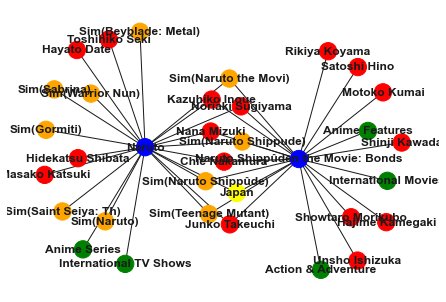

In [88]:
def get_all_adj_nodes(list_in):
    sub_graph=set()
    for m in list_in:
        sub_graph.add(m)
        for e in G.neighbors(m):        
                sub_graph.add(e)
    return list(sub_graph)
def draw_sub_graph(sub_graph):
    subgraph = G.subgraph(sub_graph)
    colors=[]
    for e in subgraph.nodes():
        if G.nodes[e]['label']=="MOVIE":
            colors.append('blue')
        elif G.nodes[e]['label']=="PERSON":
            colors.append('red')
        elif G.nodes[e]['label']=="CAT":
            colors.append('green')
        elif G.nodes[e]['label']=="COU":
            colors.append('yellow')
        elif G.nodes[e]['label']=="SIMILAR":
            colors.append('orange')    
        elif G.nodes[e]['label']=="CLUSTER":
            colors.append('orange')

    nx.draw(subgraph, with_labels=True, font_weight='bold',node_color=colors)
    plt.show()
list_in=["Naruto","Naruto Shippûden the Movie: Bonds"]
sub_graph = get_all_adj_nodes(list_in)
draw_sub_graph(sub_graph)

## The recommendation function

Explore the neighborhood of the target film → this is a list of actor, director, country, categorie

Explore the neighborhood of each neighbor → discover the movies that share a node with the target field

Calcul Adamic Adar measure → final results

In [89]:
def get_recommendation(root):
    commons_dict = {}
    for e in G.neighbors(root):
        for e2 in G.neighbors(e):
            if e2==root:
                continue
            if G.nodes[e2]['label']=="MOVIE":
                commons = commons_dict.get(e2)
                if commons==None:
                    commons_dict.update({e2 : [e]})
                else:
                    commons.append(e)
                    commons_dict.update({e2 : commons})
    movies=[]
    weight=[]
    for key, values in commons_dict.items():
        w=0.0
        for e in values:
            w=w+1/math.log(G.degree(e))
        movies.append(key) 
        weight.append(w)
    
    result = pd.Series(data=np.array(weight),index=movies)
    result.sort_values(inplace=True,ascending=False)        
    return result;

## Stage 3 Recommendations System

## Let's test it

In [90]:
result = get_recommendation("Naruto")
result2 = get_recommendation("Shopkins: Chef Club")
result3 = get_recommendation("Stranger Things")
result4 = get_recommendation("Get on Up")
print("*"*40+"\n Recommendation for 'Naruto'\n"+"*"*40)
print(result.head())
print("*"*40+"\n Recommendation for 'Shopkins: Chef Club'\n"+"*"*40)
print(result2.head())
print("*"*40+"\n Recommendation for 'Hell Boy'\n"+"*"*40)
print(result3.head())
print("*"*40+"\n Recommendation for 'Get on Up'\n"+"*"*40)
print(result4.head())

****************************************
 Recommendation for 'Naruto'
****************************************
Naruto Shippûden the Movie: Bonds                    3.967140
Naruto Shippuden: The Movie                          3.839879
Naruto Shippuden : Blood Prison                      3.450008
Naruto the Movie: Ninja Clash in the Land of Snow    3.074319
Naruto Shippuden the Movie: Blood Prison             3.047578
dtype: float64
****************************************
 Recommendation for 'Shopkins: Chef Club'
****************************************
Shopkins: Wild                             3.032889
Shopkins: World Vacation                   2.538002
Shopkins                                   1.959321
Miraculous: Tales of Ladybug & Cat Noir    1.031992
Ever After High                            0.910239
dtype: float64
****************************************
 Recommendation for 'Hell Boy'
****************************************
Beyond Stranger Things     11.187390
Rowdy Rathore  

# We can see that our improved Recommendation System works very well.

In each Stage system working better and better